### Read one final image to know what is each band

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates
import rasterio


In [3]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

In [4]:
# Open the .tif image file
with rasterio.open('tif_files_final/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif') as dataset:
    # # Get the number of bands in the image
    # num_bands = dataset.count
    
    # # Iterate over each band
    # for band in range(1, num_bands + 1):
    #     # Read the band data
    #     band_data = dataset.read(band)
        
    #     # Get the band name
    #     band_name = band_labels[band - 1]
        
    #     # Plot the band data
    #     plt.imshow(band_data, cmap='gray')
    #     plt.title(f'Band {band}: {band_name}')
    #     plt.colorbar()
    #     plt.show()

    print(dataset.read(38).mean())
    

0.059054542


### Análise das bandas e da variação da radiância após a correção

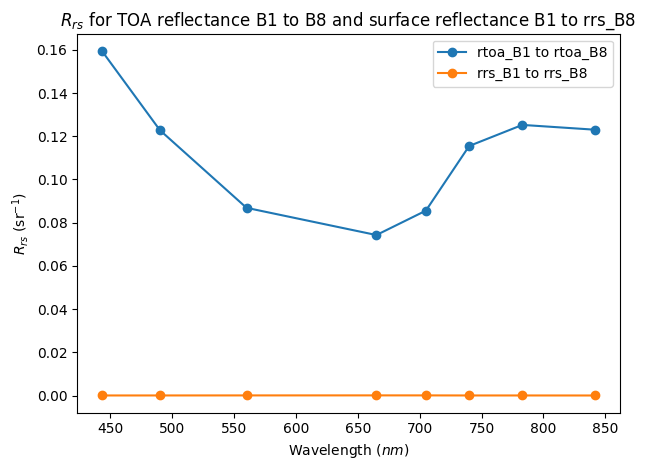

In [5]:
# Open the geotiff file
with rasterio.open('S2_MSIL1C_20230118T110401_samp_mask_C2RCC_mathbands.tif') as dataset:
    # Read the bands B1, B2, B3, B4, B5, B6, B7, and B8
    band1 = dataset.read(band_indices['rtoa_B1'])
    band2 = dataset.read(band_indices['rtoa_B2'])
    band3 = dataset.read(band_indices['rtoa_B3'])
    band4 = dataset.read(band_indices['rtoa_B4'])
    band5 = dataset.read(band_indices['rtoa_B5'])
    band6 = dataset.read(band_indices['rtoa_B6'])
    band7 = dataset.read(band_indices['rtoa_B7'])
    band8 = dataset.read(band_indices['rtoa_B8'])

    # Calculate the mean of pixel values for each band
    mean_band1 = band1.mean()
    mean_band2 = band2.mean()
    mean_band3 = band3.mean()
    mean_band4 = band4.mean()
    mean_band5 = band5.mean()
    mean_band6 = band6.mean()
    mean_band7 = band7.mean()
    mean_band8 = band8.mean()

    # Plot the mean values
    wavelengths = [443, 490, 560, 665, 705, 740, 783, 842]
    mean_values = [mean_band1, mean_band2, mean_band3, mean_band4, mean_band5, mean_band6, mean_band7, mean_band8]

    plt.plot(wavelengths, mean_values, marker='o', label='rtoa_B1 to rtoa_B8')
    
    # Read the bands rrs_B1 to rrs_B8
    rrs_band1 = dataset.read(band_indices['rrs_B1'])
    rrs_band2 = dataset.read(band_indices['rrs_B2'])
    rrs_band3 = dataset.read(band_indices['rrs_B3'])
    rrs_band4 = dataset.read(band_indices['rrs_B4'])
    rrs_band5 = dataset.read(band_indices['rrs_B5'])
    rrs_band6 = dataset.read(band_indices['rrs_B6'])
    rrs_band7 = dataset.read(band_indices['rrs_B7'])
    rrs_band8 = dataset.read(band_indices['rrs_B8A'])

    # Calculate the mean of pixel values for each rrs band
    mean_rrs_band1 = rrs_band1.mean()
    mean_rrs_band2 = rrs_band2.mean()
    mean_rrs_band3 = rrs_band3.mean()
    mean_rrs_band4 = rrs_band4.mean()
    mean_rrs_band5 = rrs_band5.mean()
    mean_rrs_band6 = rrs_band6.mean()
    mean_rrs_band7 = rrs_band7.mean()
    mean_rrs_band8 = rrs_band8.mean()

    # Plot the mean values for rrs bands
    mean_rrs_values = [mean_rrs_band1, mean_rrs_band2, mean_rrs_band3, mean_rrs_band4, mean_rrs_band5, mean_rrs_band6, mean_rrs_band7, mean_rrs_band8]
    
    plt.plot(wavelengths, mean_rrs_values, marker='o', label='rrs_B1 to rrs_B8')

    # # Read the bands rrs_B1 to rrs_B8
    # rrs_band1 = dataset.read(band_indices['rpath_B1'])
    # rrs_band2 = dataset.read(band_indices['rpath_B2'])
    # rrs_band3 = dataset.read(band_indices['rpath_B3'])
    # rrs_band4 = dataset.read(band_indices['rpath_B4'])
    # rrs_band5 = dataset.read(band_indices['rpath_B5'])
    # rrs_band6 = dataset.read(band_indices['rpath_B6'])
    # rrs_band7 = dataset.read(band_indices['rpath_B7'])
    # rrs_band8 = dataset.read(band_indices['rpath_B8A'])

    # # Calculate the mean of pixel values for each rrs band
    # mean_rpath_band1 = rrs_band1.mean()
    # mean_rpath_band2 = rrs_band2.mean()
    # mean_rpath_band3 = rrs_band3.mean()
    # mean_rpath_band4 = rrs_band4.mean()
    # mean_rpath_band5 = rrs_band5.mean()
    # mean_rpath_band6 = rrs_band6.mean()
    # mean_rpath_band7 = rrs_band7.mean()
    # mean_rpath_band8 = rrs_band8.mean()

    # # Plot the mean values for rrs bands
    # mean_rpath_values = [mean_rpath_band1, mean_rpath_band2, mean_rpath_band3, mean_rpath_band4, mean_rpath_band5, mean_rpath_band6, mean_rpath_band7, mean_rpath_band8]
    
    # plt.plot(wavelengths, mean_rpath_values, marker='o', label='rpath_B1 to rpath_B8')
    

    plt.xlabel('Wavelength ($nm$)')
    plt.ylabel('$R_{rs}$ (sr$^{-1}$)')
    plt.title('$R_{rs}$ for TOA reflectance B1 to B8 and surface reflectance B1 to rrs_B8')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Data processing

### Load and cleaning data

In [6]:
import pandas as pd

# Read the Excel file
excel_file = pd.ExcelFile('results_consolidate_for_pandas.xlsx')

# Get the names of all tabs in the Excel file
sheet_names = excel_file.sheet_names

# Create an empty dictionary to store the dataframes
dataframes = {}

# Iterate over each tab
for sheet_name in sheet_names:
    # Read the tab as a dataframe
    df = excel_file.parse(sheet_name)
    
    # Store the dataframe in the dictionary
    dataframes[sheet_name] = df

# Access the dataframes by their tab names
for sheet_name, df in dataframes.items():
    print(f"Dataframe for tab '{sheet_name}':")
    display(df)
    print()


Dataframe for tab 'results_1':


,Date,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
0,2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
1,2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2,2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
3,2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
4,2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
5,2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
6,2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
7,2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
8,2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000
9,2023-04-05 10:50:31,7.666250,3.653183,4.080029,1.535478,10.042680,5.456768,1.208580,3.616397,4.028777,...,4.1554,5.0061,2.2380,10.3710,5.8829,2.0773,2.690000,1.7600,32.7500,2.81500



Dataframe for tab 'data_loco':


,time,chlorophylle A
0,2022-09-30 09:31:00,10.18
1,2022-09-30 09:46:00,10.61
2,2022-09-30 10:01:00,9.56
3,2022-09-30 10:16:00,7.93
4,2022-09-30 10:31:00,12.47
...,...,...
31923,2023-10-03 07:01:00,68.80
31924,2023-10-03 07:16:00,58.34
31925,2023-10-03 07:31:00,60.49
31926,2023-10-03 07:46:00,49.99



Dataframe for tab 'meteo':


,Date,Temperature,Pressure,Ozone
0,2022-10-07 10:49:31,17.740,1002.9475,279.259583
1,2022-10-22 10:50:09,19.884,993.8275,261.562775
2,2022-11-01 10:51:09,16.368,998.8075,287.823151
3,2022-11-04 11:01:29,12.344,992.3275,287.823151
4,2023-01-18 11:04:01,4.968,982.7150,250.000000
5,2023-02-07 11:02:21,4.696,1016.4850,265.382355
6,2023-02-14 10:51:41,7.264,1011.1000,227.686096
7,2023-02-27 11:00:11,5.184,1005.6425,161.950439
8,2023-04-03 10:56:29,9.692,1006.4725,300.000000
9,2023-04-05 10:50:31,11.548,1001.8400,378.380219



Dataframe for tab 'vimeo_data_sensor':


,date,time,depth,totChl
0,19.09.2022,12:39:21,0.42,26.65
1,19.09.2022,12:39:24,0.41,25.90
2,19.09.2022,12:39:27,0.42,24.35
3,19.09.2022,12:39:30,0.44,25.74
4,19.09.2022,12:39:32,0.44,27.10
...,...,...,...,...
2104,12.06.2023,10:20:55,5.03,56.16
2105,12.06.2023,10:20:58,5.04,58.30
2106,12.06.2023,10:21:01,5.03,60.31
2107,12.06.2023,10:21:03,5.03,60.38



Dataframe for tab 'laboratory_data':


,Date,Chla Conc,Secchi_m
0,2022-10-27,31.47,1.00
1,2022-11-17,27.85,1.90
2,2022-12-13,2.22,5.00
3,2023-01-04,1.14,5.20
4,2023-02-09,4.08,5.00
5,2023-03-13,122.03,NaN
6,2023-04-13,1.94,NaN
7,2023-06-12,10.47,2.60
8,2023-07-21,70.21,0.75
9,2023-08-24,11.42,1.20


In [7]:
# Read the Excel file
df_loco = dataframes['data_loco']

#Convert the 'time' column to datetime
df_loco['time'] = pd.to_datetime(df_loco['time'])

#Set the 'time' column as the index
df_loco.set_index('time', inplace=True)

# Create dataframe for sensor data
df_vimeo = dataframes['vimeo_data_sensor']

#Convert the 'date' column to datetime
df_vimeo['date'] = pd.to_datetime(df_vimeo['date'])

#Set the 'time' column as the index
df_vimeo.set_index('date', inplace=True)

# Create dataframe for laboratory data
df_datalab = dataframes['laboratory_data']

#Convert the 'Date' column to datetime
df_datalab['Date'] = pd.to_datetime(df_datalab['Date'])

#Set the 'Date' column as the index
df_datalab.set_index('Date', inplace=True)

# Create dataframe for vimeo data with depth between 1 and 2 meters
depth_between_1_and_2 = df_vimeo[(df_vimeo['depth'] >= 1.3) & (df_vimeo['depth'] <= 1.7)]


C:\Users\arthu\AppData\Local\Temp\ipykernel_9260\3427084913.py:14: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_vimeo['date'] = pd.to_datetime(df_vimeo['date'])


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    
    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))
    
    # Plot chlorophylle-A concentration on the first y-axis
    ax1.plot(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Mean)')
    ax1.plot(daily_mean4.index, daily_mean4, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.plot(daily_mean2.index, daily_mean2, marker='o', label='Chlorophylle A - Laboratory')
    ax1.plot(daily_mean3.index, daily_mean3, marker='o', label='Chlorophylle A - Vimeo all depths')
    ax1.plot(daily_mean5.index, daily_mean5, marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_title('Time series of chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # Create a second y-axis for Secchi depth
    ax2 = ax1.twinx()
    
    # Plot Secchi depth on the second y-axis
    ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    ax2.set_ylabel('Secchi depth (m)')
    ax2.set_ylim(0, 6)
    ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    
    # Plot chlorophylle-A concentration on the first subplot
    daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)', ax=ax1)
    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', ax=ax1)
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory', ax=ax1)
    daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths', ax=ax1)
    daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths', ax=ax1)
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_xlabel('Date')
    ax1.set_title('Time series of chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # Plot Secchi depth on the second subplot
    ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    ax2.set_ylabel('Secchi depth (m)')
    ax2.set_xlabel('Date')
    ax2.set_ylim(0)
    ax2.set_title('Time series of Secchi depth')
    ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax2.xaxis.set_major_locator(mdates.MonthLocator())
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    plt.figure(figsize=(20, 10))
    daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', ls= '', label='Chlorophylle A - Laboratory')
    daily_mean3.plot(kind='line', marker='o', ls= '', label='Chlorophylle A - Vimeo all depths')
    daily_mean5.plot(kind='line', marker='o',  ls= '', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

Plotar o secchi depth no gráfico acima

Analise dos dados meteorólogicos

In [11]:
df_meteo = dataframes['meteo']
df_meteo

,Date,Temperature,Pressure,Ozone
0,2022-10-07 10:49:31,17.740,1002.9475,279.259583
1,2022-10-22 10:50:09,19.884,993.8275,261.562775
2,2022-11-01 10:51:09,16.368,998.8075,287.823151
3,2022-11-04 11:01:29,12.344,992.3275,287.823151
4,2023-01-18 11:04:01,4.968,982.7150,250.000000
5,2023-02-07 11:02:21,4.696,1016.4850,265.382355
6,2023-02-14 10:51:41,7.264,1011.1000,227.686096
7,2023-02-27 11:00:11,5.184,1005.6425,161.950439
8,2023-04-03 10:56:29,9.692,1006.4725,300.000000
9,2023-04-05 10:50:31,11.548,1001.8400,378.380219


In [12]:
# Read the dataframe
df_meteo = dataframes['meteo']

#Convert the 'time' column to datetime
df_meteo['Date'] = pd.to_datetime(df_meteo['Date'])

#Set the 'time' column as the index
df_meteo.set_index('Date', inplace=True)

# Display the dataframe
df_meteo

,Temperature,Pressure,Ozone
Date,,,
2022-10-07 10:49:31,17.740,1002.9475,279.259583
2022-10-22 10:50:09,19.884,993.8275,261.562775
2022-11-01 10:51:09,16.368,998.8075,287.823151
2022-11-04 11:01:29,12.344,992.3275,287.823151
2023-01-18 11:04:01,4.968,982.7150,250.000000
2023-02-07 11:02:21,4.696,1016.4850,265.382355
2023-02-14 10:51:41,7.264,1011.1000,227.686096
2023-02-27 11:00:11,5.184,1005.6425,161.950439
2023-04-03 10:56:29,9.692,1006.4725,300.000000


In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-09-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_meteo.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    temperature = filtered_df['Temperature'].resample('D').mean().dropna()
    ozone = filtered_df['Ozone'].resample('D').mean().dropna()
    pressure = filtered_df['Pressure'].resample('D').mean().dropna()

    fig, axes = plt.subplots(3, 1, figsize=(20, 15))
    
    axes[0].plot(temperature.index, temperature.values, marker='^', linestyle='solid', color='red', linewidth=2)
    axes[0].set_ylabel('Temperature ($^{\circ}C$)')
    axes[0].set_xlabel('Date')
    axes[0].set_title('Temperature')
    
    axes[1].plot(ozone,linestyle='solid',  marker='o', color='green', linewidth=2)
    axes[1].set_ylabel('Ozone ($DU$)')
    axes[1].set_xlabel('Date')
    axes[1].set_title('Ozone')
    
    axes[2].plot(pressure, linestyle='solid', marker='s', color='blue', linewidth=2)
    axes[2].set_ylabel('Air Pressure ($hPa$)')
    axes[2].set_xlabel('Date')
    axes[2].set_title('Air Pressure')
    
    # Format x-axis ticks as months (mm/yyyy)
    for ax in axes:
        ax.xaxis.set_major_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()
    plt.savefig('results_images/meteo.png')

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2022-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-09-30 00:00:00'), description='End Date', step=1)

Output()

Mean data of ozone and pressure for use in the report

In [14]:
ozone = df_meteo['Ozone'].resample('D').mean().dropna()
display(ozone)
print(ozone.mean())

Date
2022-10-07    279.259583
2022-10-22    261.562775
2022-11-01    287.823151
2022-11-04    287.823151
2023-01-18    250.000000
2023-02-07    265.382355
2023-02-14    227.686096
2023-02-27    161.950439
2023-04-03    300.000000
2023-04-05    378.380219
2023-04-08    357.013184
2023-05-03    352.213623
2023-05-20    350.569885
2023-05-25    344.975952
2023-05-28    360.705872
2023-06-02    335.737518
2023-06-04    339.699921
2023-06-07    357.505157
2023-06-14    354.186310
2023-08-21    297.653030
2023-09-02    317.626312
2023-09-07    271.778412
2023-09-10    267.492920
2023-09-15    287.311768
2023-09-25    258.814514
Name: Ozone, dtype: float64

302.12608589999996


In [15]:
pressure = df_meteo['Pressure'].resample('D').mean().dropna()
display(pressure)
print(pressure.mean())


Date
2022-10-07    1002.9475
2022-10-22     993.8275
2022-11-01     998.8075
2022-11-04     992.3275
2023-01-18     982.7150
2023-02-07    1016.4850
2023-02-14    1011.1000
2023-02-27    1005.6425
2023-04-03    1006.4725
2023-04-05    1001.8400
2023-04-08    1004.5750
2023-05-03    1001.2425
2023-05-20     999.3150
2023-05-25    1005.7775
2023-05-28     998.7325
2023-06-02     999.7550
2023-06-04     999.5225
2023-06-07     997.9875
2023-06-14     995.8575
2023-08-21    1004.0550
2023-09-02    1001.0750
2023-09-07     998.1875
2023-09-10     997.5600
2023-09-15     994.5700
2023-09-25    1003.7325
Name: Pressure, dtype: float64

1000.5644


### Reading all .tif files and plotting in subplot

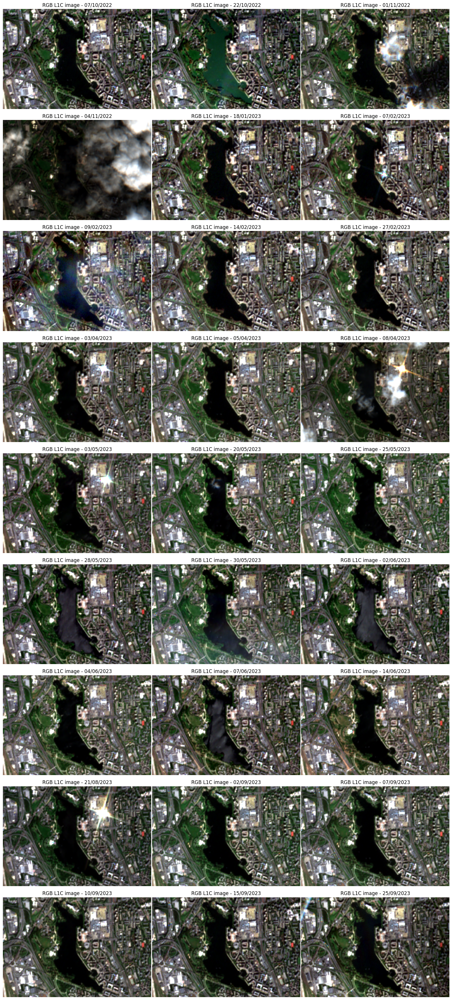

In [16]:
import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

directory = 'tif_subset_files/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[5]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Number of columns in the plot
num_colunas = 3

# Calculate the number of lines in the plot
num_linhas = (len(arquivos_tif) + num_colunas - 1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 5 * num_linhas))
fig.subplots_adjust(wspace=0.005, hspace=0.0005,)

def stretch(band, lower_percent=2, higher_percent=98):
    a = 0 # min value
    b = 255 # max value
    c = np.percentile(band, lower_percent)
    d = np.percentile(band, higher_percent)
    t = a + (band - c) * (b - a) / (d - c)
    t[t<a] = a
    t[t>b] = b
    return t

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        rgb = src.read([4, 3, 2])

        # Normalize the bands using histogram stretching
        for band in range(rgb.shape[0]):
            rgb[band] = stretch(rgb[band])

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        # Plot the RGB image on the subplot
        axs[linha, coluna].imshow(rgb.transpose((1, 2, 0)) / 255)  # Divide by 255 to normalize to 0-1
        axs[linha, coluna].set_title(f'RGB L1C image - {date.strftime("%d/%m/%Y")}')
        axs[linha, coluna].axis('off')
        
# Remove all axes from the subplots
for ax in axs.flat:
    ax.axis('off')

# Exibir a figura
plt.show()

### Análise das bandas e da variação da radiância após a correção

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import os
import sys

In [18]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

### Análise das bandas e da variação da radiância após a correção

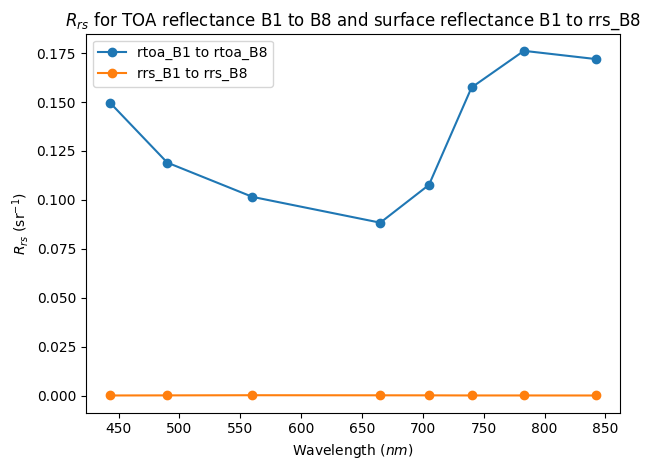

In [19]:
# Open the geotiff file
with rasterio.open('tif_files/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif') as dataset:
    # Read the bands B1, B2, B3, B4, B5, B6, B7, and B8
    band1 = dataset.read(band_indices['rtoa_B1'])
    band2 = dataset.read(band_indices['rtoa_B2'])
    band3 = dataset.read(band_indices['rtoa_B3'])
    band4 = dataset.read(band_indices['rtoa_B4'])
    band5 = dataset.read(band_indices['rtoa_B5'])
    band6 = dataset.read(band_indices['rtoa_B6'])
    band7 = dataset.read(band_indices['rtoa_B7'])
    band8 = dataset.read(band_indices['rtoa_B8'])

    # Calculate the mean of pixel values for each band
    mean_band1 = band1.mean()
    mean_band2 = band2.mean()
    mean_band3 = band3.mean()
    mean_band4 = band4.mean()
    mean_band5 = band5.mean()
    mean_band6 = band6.mean()
    mean_band7 = band7.mean()
    mean_band8 = band8.mean()

    # Plot the mean values
    wavelengths = [443, 490, 560, 665, 705, 740, 783, 842]
    mean_values = [mean_band1, mean_band2, mean_band3, mean_band4, mean_band5, mean_band6, mean_band7, mean_band8]

    plt.plot(wavelengths, mean_values, marker='o', label='rtoa_B1 to rtoa_B8')
    
    # Read the bands rrs_B1 to rrs_B8
    rpath_band1 = dataset.read(band_indices['rrs_B1'])
    rrs_band2 = dataset.read(band_indices['rrs_B2'])
    rrs_band3 = dataset.read(band_indices['rrs_B3'])
    rrs_band4 = dataset.read(band_indices['rrs_B4'])
    rrs_band5 = dataset.read(band_indices['rrs_B5'])
    rrs_band6 = dataset.read(band_indices['rrs_B6'])
    rrs_band7 = dataset.read(band_indices['rrs_B7'])
    rrs_band8 = dataset.read(band_indices['rrs_B8A'])

    # Calculate the mean of pixel values for each rrs band
    mean_rrs_band1 = rrs_band1.mean()
    mean_rrs_band2 = rrs_band2.mean()
    mean_rrs_band3 = rrs_band3.mean()
    mean_rrs_band4 = rrs_band4.mean()
    mean_rrs_band5 = rrs_band5.mean()
    mean_rrs_band6 = rrs_band6.mean()
    mean_rrs_band7 = rrs_band7.mean()
    mean_rrs_band8 = rrs_band8.mean()

    # Plot the mean values for rrs bands
    mean_rrs_values = [mean_rrs_band1, mean_rrs_band2, mean_rrs_band3, mean_rrs_band4, mean_rrs_band5, mean_rrs_band6, mean_rrs_band7, mean_rrs_band8]
    
    plt.plot(wavelengths, mean_rrs_values, marker='o', label='rrs_B1 to rrs_B8')

    # # Read the bands rrs_B1 to rrs_B8
    # rrs_band1 = dataset.read(band_indices['rpath_B1'])
    # rrs_band2 = dataset.read(band_indices['rpath_B2'])
    # rrs_band3 = dataset.read(band_indices['rpath_B3'])
    # rrs_band4 = dataset.read(band_indices['rpath_B4'])
    # rrs_band5 = dataset.read(band_indices['rpath_B5'])
    # rrs_band6 = dataset.read(band_indices['rpath_B6'])
    # rrs_band7 = dataset.read(band_indices['rpath_B7'])
    # rrs_band8 = dataset.read(band_indices['rpath_B8A'])

    # # Calculate the mean of pixel values for each rrs band
    # mean_rpath_band1 = rrs_band1.mean()
    # mean_rpath_band2 = rrs_band2.mean()
    # mean_rpath_band3 = rrs_band3.mean()
    # mean_rpath_band4 = rrs_band4.mean()
    # mean_rpath_band5 = rrs_band5.mean()
    # mean_rpath_band6 = rrs_band6.mean()
    # mean_rpath_band7 = rrs_band7.mean()
    # mean_rpath_band8 = rrs_band8.mean()

    # # Plot the mean values for rrs bands
    # mean_rpath_values = [mean_rpath_band1, mean_rpath_band2, mean_rpath_band3, mean_rpath_band4, mean_rpath_band5, mean_rpath_band6, mean_rpath_band7, mean_rpath_band8]
    
    # plt.plot(wavelengths, mean_rpath_values, marker='o', label='rpath_B1 to rpath_B8')
    

    plt.xlabel('Wavelength ($nm$)')
    plt.ylabel('$R_{rs}$ (sr$^{-1}$)')
    plt.title('$R_{rs}$ for TOA reflectance B1 to B8 and surface reflectance B1 to rrs_B8')
    plt.legend()

    plt.tight_layout()
    plt.show()

### Plot Spectral schema

Analysis of the reflectance values of the resampled L1C images in Subplots individually

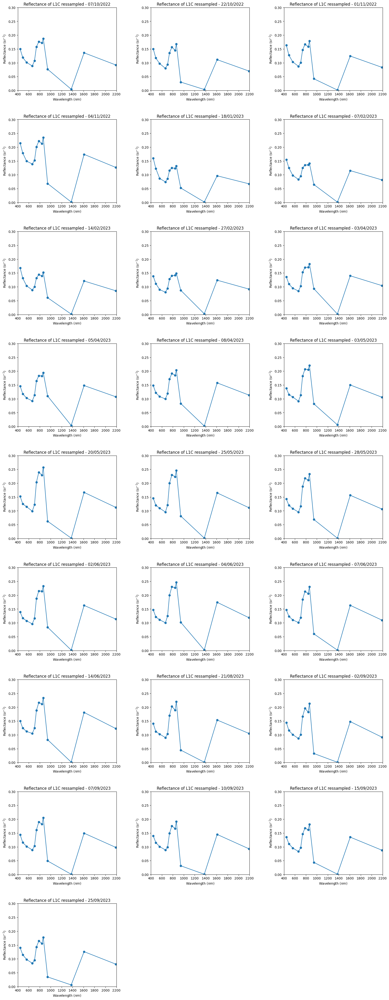

In [20]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[3]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Number of columns in the plot
num_colunas = 3

# Calculate the number of lines in the plot
num_linhas = (len(arquivos_tif) + num_colunas - 1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 6 * num_linhas))
fig.subplots_adjust(wspace=0.35, hspace=0.35)

# Lista de bandas para Rtoa
band_indices_new = { 'B1': band_indices['rtoa_B1'], 'B2': band_indices['rtoa_B2'], 'B3': band_indices['rtoa_B3'], 'B4': band_indices['rtoa_B4'], 'B5': band_indices['rtoa_B5'], \
                 'B6': band_indices['rtoa_B6'], 'B7': band_indices['rtoa_B7'], 'B8': band_indices['rtoa_B8'], 'B8A': band_indices['rtoa_B8A'], 'B9': band_indices['rtoa_B9'], \
                 'B10': band_indices['rtoa_B10'], 'B11': band_indices['rtoa_B11'], 'B12': band_indices['rtoa_B12'] }

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783, 842, 865, 945, 1375, 1610, 2190]

        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        axs[linha, coluna].plot(wavelengths, rrs_values, marker='o')
        axs[linha, coluna].set_xlabel('Wavelength ($nm$)')
        axs[linha, coluna].set_ylabel('Reflectance (sr$^{-1}$)')
        axs[linha, coluna].set_title(f'Reflectance of L1C ressampled - {date.strftime("%d/%m/%Y")}')


# Limiting the y-axis and x-axis
for ax in axs.flat:
    ax.set_ylim(0, 0.3)
    ax.set_xlim(400, 2200)

# Remove all axes from the empty subplots
for i in range(len(arquivos_tif), num_linhas * num_colunas):
    axs.flatten()[i].axis('off')

# Exibir a figura
plt.show()

Analysis of the reflectance values of the resampled L1C images in one plot

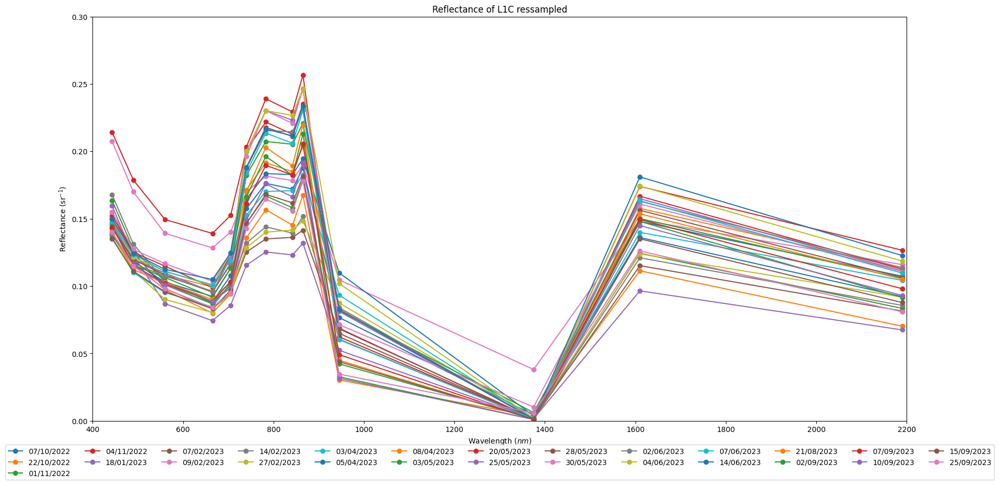

In [21]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(20, 10))

# List of bands for Reflectance TOA
band_indices_new = { 'B1': band_indices['rtoa_B1'], 'B2': band_indices['rtoa_B2'], 'B3': band_indices['rtoa_B3'], 'B4': band_indices['rtoa_B4'], 'B5': band_indices['rtoa_B5'], \
                 'B6': band_indices['rtoa_B6'], 'B7': band_indices['rtoa_B7'], 'B8': band_indices['rtoa_B8'], 'B8A': band_indices['rtoa_B8A'], 'B9': band_indices['rtoa_B9'], \
                 'B10': band_indices['rtoa_B10'], 'B11': band_indices['rtoa_B11'], 'B12': band_indices['rtoa_B12'] }

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783, 842, 865, 945, 1375, 1610, 2190]

        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)

        # Identify which band has the highest/minimum value - Help for the report
        # print(rrs_values[3], 'for ', date.strftime("%d/%m/%Y"))

    ax.plot(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Reflectance (sr$^{-1}$)')
ax.set_title('Reflectance of L1C ressampled')

# Set y-axis and x-axis limits
ax.set_ylim(0, 0.3)
ax.set_xlim(400, 2200)

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)




# Exibir a figura
plt.show()

### Analyse masks - For the report

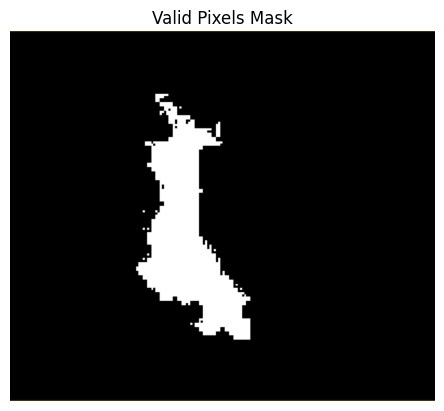

In [22]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read the PNG image
image_path = 'results_images\image of the mask.png'
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.title('Valid Pixels Mask')
plt.axis('off')
plt.show()


### Analysing C2RCC outputs

In [23]:
# Load the output indices again

# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

Analise do Rrs para o pós C2RCC

C:\Users\arthu\AppData\Local\Temp\ipykernel_9260\2416464337.py:47: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


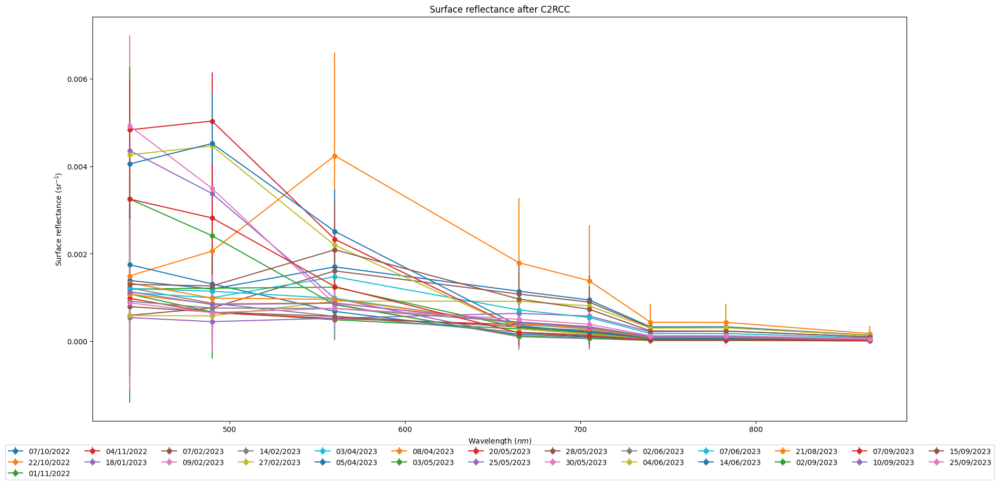

In [24]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(20, 10))

# List of bands for Reflectance TOA
band_indices_new = { 'B1': band_indices['rrs_B1'], 'B2': band_indices['rrs_B2'], 'B3': band_indices['rrs_B3'], 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7'], 'B8A': band_indices['rrs_B8A']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783,  865]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars
        ax.errorbar(wavelengths, rrs_values, yerr=std_rrs_band, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

C:\Users\arthu\AppData\Local\Temp\ipykernel_9260\4105925117.py:47: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()


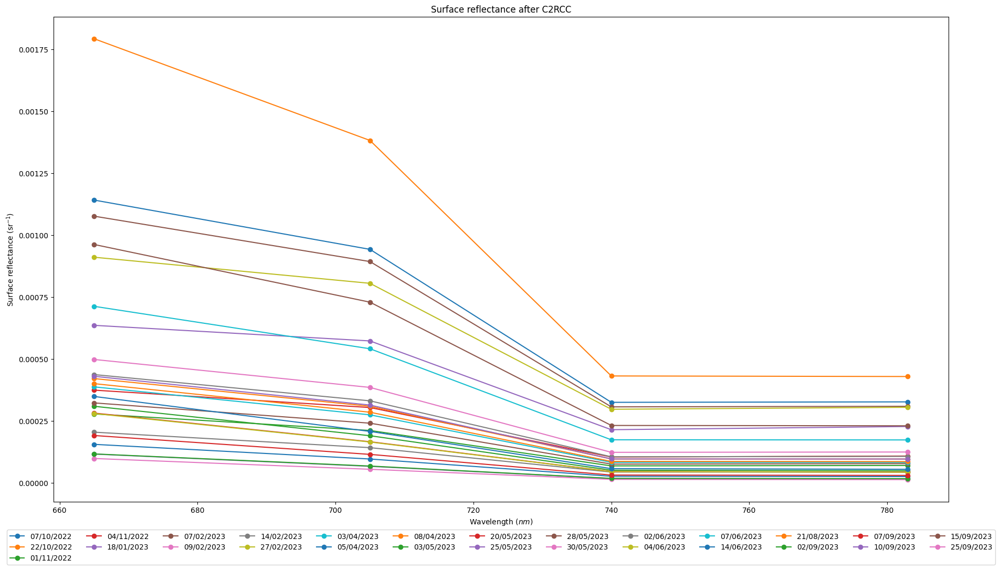

In [25]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(22, 12))

# List of bands for Reflectance TOA
band_indices_new = { 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [ 665, 705, 740, 783]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars
        ax.errorbar(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

In [26]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Initialize an empty dataframe
df_c2rcc = pd.DataFrame()
# List of bands for Reflectance TOA
band_indices_new = {'conc_chl': band_indices['conc_chl'], 'unc_chl': band_indices['unc_chl'], 'Chlorophyll index 3-bands': band_indices['3_bands_model_chl_conc'], \
                    'Empirical 2-bands - Equation 1': band_indices['empirical_2_bands_equation1'], 'Empirical 2-bands - Equation 2': band_indices['empirical_2_bands_equation2'], \
                    'Empirical 3-bands - Equation 1': band_indices['empirical_3_bands_equation1'], 'Empirical 3-bands - Equation 3': band_indices['empirical_3_bands_equation3'], \
                    'Rrs_B4': band_indices['rrs_B4'], 'Rrs_B5': band_indices['rrs_B5'], \
                    'Rrs_B6': band_indices['rrs_B6'], 'Rrs_B7': band_indices['rrs_B7'], 'iop_apig': band_indices['iop_apig'], 'unc_apig': band_indices['unc_apig']}

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]

            # Classsification of the bands with no values
            if rrs_band.size == 0:
                rrs_values.append(np.nan)
                rrs_values.append(np.nan)
                continue
            
            # Testing filtering outliers
            # Filtering outliers quartile 1 and 3
            q1 = np.percentile(rrs_band, 25)
            q3 = np.percentile(rrs_band, 75)
            iqr = q3 - q1
            rrs_band = rrs_band[(rrs_band > q1 - 1.5 * iqr) & (rrs_band < q3 + 1.5 * iqr)]
    
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)
            
            # Testing with median
            #median_rrs_band = np.median(rrs_band)
            #rrs_values.append(median_rrs_band)

            if not band_name in ['conc_chl', 'unc_chl', 'iop_apig', 'unc_apig']:
                error_rrs_band = rrs_band.std()
                rrs_values.append(error_rrs_band)

        # Create a dictionary with the date and mean values of each band
        data = {'Date': date, 'conc_chl': rrs_values[0], 'unc_chl': rrs_values[1], 'Chlorophyll index 3-bands': rrs_values[2], \
                'unc_Chlorophyll index 3-bands':rrs_values[3], \
                'Empirical 2-bands - Equation 1': rrs_values[4], 'unc_Empirical 2-bands - Equation 1': rrs_values[5],\
                'Empirical 2-bands - Equation 2': rrs_values[6], 'unc_Empirical 2-bands - Equation 2': rrs_values[7], \
                'Empirical 3-bands - Equation 1': rrs_values[8], 'unc_Empirical 3-bands - Equation 1': rrs_values[9],\
                'Empirical 3-bands - Equation 3': rrs_values[10], 'unc_Empirical 3-bands - Equation 3': rrs_values[11], \
                'Rrs_B4':  rrs_values[12], 'unc_Rrs_B4':  rrs_values[13], \
                'Rrs_B5':  rrs_values[14], 'unc_Rrs_B5':  rrs_values[15], \
                'Rrs_B6':  rrs_values[16], 'unc_Rrs_B6':  rrs_values[17], \
                'Rrs_B7':  rrs_values[18], 'unc_Rrs_B7':  rrs_values[19], \
                'iop_apig':  rrs_values[20], 'unc_apig':  rrs_values[21]
                }
        
        # Append the dictionary as a new row to the dataframe
        df_c2rcc = pd.concat([df_c2rcc, pd.DataFrame(data, index=[0])], ignore_index=True)

# Remove the images that didn't pass the quality control
df_c2rcc.dropna(inplace=True)

# Print the dataframe
display(df_c2rcc)


C:\Users\arthu\AppData\Local\Temp\ipykernel_9260\1208632320.py:82: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_c2rcc = pd.concat([df_c2rcc, pd.DataFrame(data, index=[0])], ignore_index=True)


,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,...,Rrs_B4,unc_Rrs_B4,Rrs_B5,unc_Rrs_B5,Rrs_B6,unc_Rrs_B6,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig
0,2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,...,0.001123,0.000791,0.000925,0.000679,0.000319,0.000241,0.000321,0.000242,0.612788,0.117512
1,2022-10-22 10:50:09,11.492252,1.654627,9.328502,3.633259,12.450475,6.345382,8.282675,4.702090,13.470339,...,0.001719,0.001363,0.001302,0.001128,0.000402,0.000369,0.000399,0.000369,0.555634,0.086151
2,2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,...,0.000224,0.000153,0.000169,0.000126,0.000055,0.000043,0.000057,0.000045,0.428348,0.067987
3,2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,...,0.000314,0.000203,0.000254,0.000184,0.000085,0.000066,0.000090,0.000071,0.456232,0.076936
4,2023-01-18 11:04:01,7.477668,1.399750,16.576378,5.128100,26.537342,6.926394,17.269571,3.624295,18.017925,...,0.000534,0.000318,0.000474,0.000307,0.000175,0.000123,0.000187,0.000129,0.362530,0.072983
5,2023-02-07 11:02:21,16.193861,2.275436,12.733088,3.144849,21.000359,5.140545,13.782638,3.048241,15.777712,...,0.001059,0.000639,0.000877,0.000560,0.000301,0.000199,0.000302,0.000199,0.773380,0.117438
7,2023-02-14 10:51:41,2.370013,0.320445,4.629401,1.181029,6.803401,4.246818,3.521503,2.907795,10.810039,...,0.000148,0.000085,0.000094,0.000060,0.000026,0.000019,0.000026,0.000019,0.121729,0.017866
8,2023-02-27 11:00:11,11.119368,1.873018,16.276752,3.196611,26.359098,5.251359,16.807116,2.795807,17.675684,...,0.000862,0.000557,0.000759,0.000513,0.000281,0.000198,0.000288,0.000200,0.539540,0.098203
9,2023-04-03 10:56:29,14.697074,1.949671,8.704678,3.146333,13.688530,6.596522,8.541276,4.513333,13.319324,...,0.000671,0.000435,0.000499,0.000345,0.000157,0.000115,0.000156,0.000114,0.702709,0.100823
10,2023-04-05 10:50:31,1.058552,0.141695,3.834559,0.643721,3.846885,1.444464,1.464515,1.068633,10.095224,...,0.000122,0.000050,0.000070,0.000031,0.000018,0.000009,0.000017,0.000008,0.056245,0.008133


In [27]:
#Convert the 'time' column to datetime
df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])

#Set the 'time' column as the index
df_c2rcc.set_index('Date', inplace=True)

# Merge with in loco data
df_c2rcc = pd.merge_asof(df_c2rcc, df_loco, right_index = True, left_index = True,  direction='nearest')

# Print the dataframe
display(df_c2rcc.head())


,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,...,unc_Rrs_B4,Rrs_B5,unc_Rrs_B5,Rrs_B6,unc_Rrs_B6,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig,chlorophylle A
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,1.657321,...,0.000791,0.000925,0.000679,0.000319,0.000241,0.000321,0.000242,0.612788,0.117512,9.83
2022-10-22 10:50:09,11.492252,1.654627,9.328502,3.633259,12.450475,6.345382,8.282675,4.702090,13.470339,2.233648,...,0.001363,0.001302,0.001128,0.000402,0.000369,0.000399,0.000369,0.555634,0.086151,4.67
2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,1.940370,...,0.000153,0.000169,0.000126,0.000055,0.000043,0.000057,0.000045,0.428348,0.067987,4.13
2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,2.783343,...,0.000203,0.000254,0.000184,0.000085,0.000066,0.000090,0.000071,0.456232,0.076936,11.13
2023-01-18 11:04:01,7.477668,1.399750,16.576378,5.128100,26.537342,6.926394,17.269571,3.624295,18.017925,2.283104,...,0.000318,0.000474,0.000307,0.000175,0.000123,0.000187,0.000129,0.362530,0.072983,0.15


In [38]:
df_c2rcc['iop_apig_function'] = df_c2rcc['iop_apig'] ** 0.75 * 20


import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]

    filtered_df6 = df_c2rcc.loc[start_date:end_date]

    # Remove the dates that are bad for the analysis
    dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
    filtered_df7 = filtered_df6[~filtered_df6.index.isin(dates_to_remove)]
    filtered_df7['iop_function_1'] = filtered_df7['iop_apig'] ** 0.75 * 20
    filtered_df7['iop_function_2'] = filtered_df7['iop_apig'] ** 0.65 * 14
    filtered_df7['iop_function_3'] = filtered_df7['iop_apig'] ** 0.75* 14
    filtered_df7['iop_function_4'] = filtered_df7['iop_apig'] ** 0.6 * 10.2
        
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()


    # Resample the data to daily frequency and calculate the mean for each day  
    daily_mean12= filtered_df7['iop_function_1'].resample('D').mean().dropna()
    daily_mean13= filtered_df7['iop_function_2'].resample('D').mean().dropna()
    daily_mean14= filtered_df7['iop_function_3'].resample('D').mean().dropna()
    daily_mean15= filtered_df7['iop_function_4'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plotting the data with low transparency
    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', alpha=0.5)

    # Ploting data with bigger points
    ax.errorbar(daily_mean13.index, daily_mean13, ls= '', markersize = 7, marker='s', label='iop_apig ** 0.65 * 14')
    ax.errorbar(daily_mean14.index, daily_mean14, ls= '', markersize = 7, marker='s', label='iop_apig ** 0.75 * 14')
    ax.errorbar(daily_mean15.index, daily_mean15, ls= '', markersize = 7, marker='s', label='iop_apig ** 0.6 * 10.2')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)




DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Fazendo o ajuste para as comparações de R^2 dos modelos previstos

C:\Users\arthu\AppData\Local\Temp\ipykernel_9260\977266539.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)


,chlorophylle A - Adjusted,conc_chl
0,12.64,12.639685
1,6.77,11.492252
2,9.03,8.879948
3,9.42,9.507055
4,3.15,7.477668
6,2.68,2.370013
7,11.10,11.119368
9,1.88,1.058552
11,5.07,2.716580
12,2.43,0.293951


Intercept: [-1.27447835]
Coefficient: [[1.21193648]]
R2: 0.8861614153034969
RMSE: 2.112534040966385


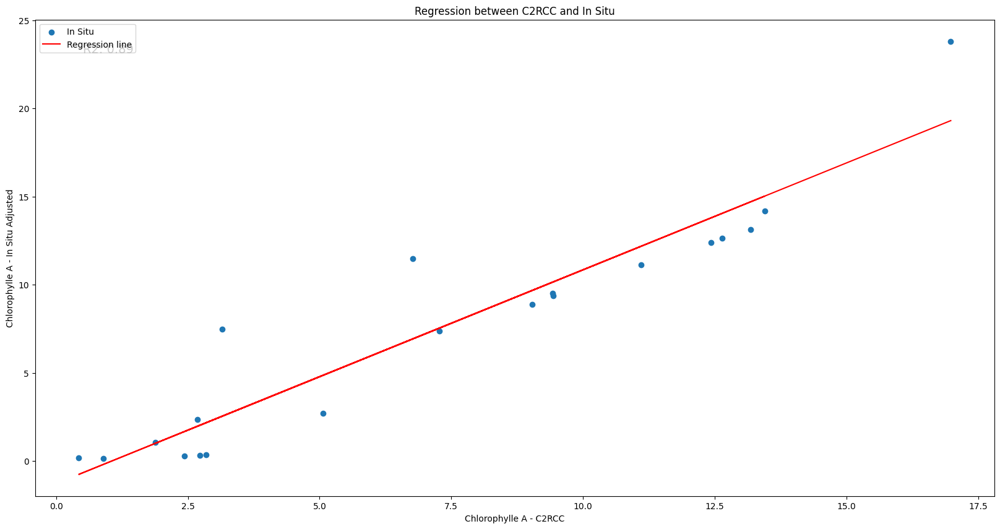

In [93]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

# # Removing the dates that are bad for the analysis
# dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
# df_c2rcc = df_c2rcc[~df_c2rcc['Date'].isin(dates_to_remove)]

# Create a new column with the closest value of chlorophyllle A from in situ data

def encontrar_valor_proximo(x, df, janela_temporal=1):
    data_alvo = x['Date']
    valor_alvo = x['conc_chl']

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        # Encontrar a linha com a menor diferença nos valores
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None

df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)

# display the columns chlorophyllle A and conc_chl
display(df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl']])

# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['chlorophylle A - Adjusted']], df_c2rcc2[['conc_chl']])
print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['chlorophylle A - Adjusted']], df_c2rcc2[['conc_chl']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['conc_chl']], model.predict(df_c2rcc2[['chlorophylle A - Adjusted']])) ** 0.5)

# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
ax.scatter(df_c2rcc2['chlorophylle A - Adjusted'], df_c2rcc2['conc_chl'], label='In Situ')
ax.plot(df_c2rcc2['chlorophylle A - Adjusted'], model.predict(df_c2rcc2[['chlorophylle A - Adjusted']]), color='red', label='Regression line')

plt.xlabel('Chlorophylle A - C2RCC')
plt.ylabel('Chlorophylle A - In Situ Adjusted')
ax.text(0.05, 0.95, f'R2: {model.score(df_c2rcc2[["chlorophylle A - Adjusted"]], df_c2rcc2[["conc_chl"]]):.2f}', transform=ax.transAxes, fontsize=14, verticalalignment='top')

plt.title('Regression between C2RCC and In Situ')
plt.legend()
plt.show()

# Show over the figure the R2, RMSE and the equation of the line








In [51]:
## df_c2rcc['Test_calculation'] = df_c2rcc['iop_apig']**(1.04) * 21

import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
import warnings

# Supondo que você já tenha um DataFrame chamado 'dados' com as colunas iop_apig, incerteza_iop_apig e concentracao_clorofila
# Substitua 'seu_data_frame' pelo nome real do seu DataFrame

# # Dados
iop_apig = df_c2rcc['iop_apig']
print(iop_apig)
incerteza_iop_apig = df_c2rcc['unc_apig']
concentracao_clorofila = df_c2rcc['chlorophylle A']

# Logaritmo natural dos dados
iop_apig = np.log(iop_apig)
incerteza_iop_apig = np.log(incerteza_iop_apig)
concentracao_clorofila = np.log(concentracao_clorofila)

# The model function
def modelo_nao_linear(iop_apig, a, b):
    return a*np.log(iop_apig) + np.log(b)

# Ajuste não linear
parametros_iniciais = [0.5, 20]  # Valores iniciais para 'a' e 'b'
dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
iop_apig = iop_apig[~iop_apig.index.isin(dates_to_remove)]
concentracao_clorofila = concentracao_clorofila[~concentracao_clorofila.index.isin(dates_to_remove)]

parametros_otimizados, covariancia = curve_fit(modelo_nao_linear, iop_apig, concentracao_clorofila, p0=parametros_iniciais)

# Desnormalização dos parâmetros

print("Parâmetros otimizados:", parametros_otimizados)

# Parâmetros otimizados
a_otimizado, b_otimizado = parametros_otimizados

# Previsões usando os parâmetros otimizados
concentracao_predita = modelo_nao_linear(iop_apig, a_otimizado, b_otimizado)

# Mostrar os parâmetros otimizados
print(f"Parâmetro 'a' otimizado: {a_otimizado}")
print(f"Parâmetro 'b' otimizado: {b_otimizado}")

# Adicionar as previsões ao DataFrame
df_c2rcc['estimated_conc_chl'] = concentracao_predita

# Visualizar o DataFrame apenas com as colunas chlorophylle A e iop_apig
display(df_c2rcc[['chlorophylle A', 'iop_apig']])

Date
2022-10-07 10:49:31    0.612788
2022-10-22 10:50:09    0.555634
2022-11-01 10:51:09    0.428348
2022-11-04 11:01:29    0.456232
2023-01-18 11:04:01    0.362530
2023-02-07 11:02:21    0.773380
2023-02-14 10:51:41    0.121729
2023-02-27 11:00:11    0.539540
2023-04-03 10:56:29    0.702709
2023-04-05 10:50:31    0.056245
2023-04-08 10:56:21    0.532376
2023-05-03 10:56:19    0.138813
2023-05-20 10:46:29    0.016303
2023-05-25 10:50:31    0.009995
2023-05-28 10:56:21    0.451385
2023-05-30 10:46:29    0.008427
2023-06-02 10:56:29    0.675142
2023-06-04 10:46:21    0.017305
2023-06-07 10:56:21    0.356986
2023-06-14 10:50:31    0.019186
2023-08-21 10:56:29    0.411453
2023-09-02 10:46:31    0.009994
2023-09-07 10:46:29    0.008201
2023-09-10 10:56:29    0.595561
2023-09-15 10:57:01    0.631974
2023-09-25 10:58:01    1.120219
Name: iop_apig, dtype: float32
Parâmetros otimizados: [ 0.5 20. ]
Parâmetro 'a' otimizado: 0.5
Parâmetro 'b' otimizado: 20.0


c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


,chlorophylle A,iop_apig
Date,,
2022-10-07 10:49:31,9.83,0.612788
2022-10-22 10:50:09,4.67,0.555634
2022-11-01 10:51:09,4.13,0.428348
2022-11-04 11:01:29,11.13,0.456232
2023-01-18 11:04:01,0.15,0.362530
2023-02-07 11:02:21,0.79,0.773380
2023-02-14 10:51:41,5.36,0.121729
2023-02-27 11:00:11,7.82,0.539540
2023-04-03 10:56:29,6.32,0.702709


In [ ]:
#Convert the 'time' column to datetime
df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])

#Set the 'time' column as the index
df_c2rcc.set_index('Date', inplace=True)

# Merge with in loco data
df_c2rcc = pd.merge_asof(df_c2rcc, df_loco, right_index = True, left_index = True,  direction='nearest')

# Print the dataframe
display(df_c2rcc.head())


Statistical analysis

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl','Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1',
               'Empirical 2-bands - Equation 2', 'Empirical 3-bands - Equation 1',
               'Empirical 3-bands - Equation 3']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(df_c2rcc[['chlorophylle A']], df_c2rcc[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(df_c2rcc[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((df_c2rcc[column] - predicted_values) / df_c2rcc[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(df_c2rcc[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((df_c2rcc[column] - predicted_values) / df_c2rcc[column]) * 100

    # Append the results to the DataFrame
    results_df = pd.concat([results_df, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df)

,Metric,R²,MAPD,RMSD,MRD
0,conc_chl,0.030395,1013.959362,6.203726,-977.978233
1,Chlorophyll index 3-bands,0.002476,62.345164,3.949815,-37.159532
2,Empirical 2-bands - Equation 1,0.001924,82.116521,6.830037,-55.326882
3,Empirical 2-bands - Equation 2,0.002870,235.751599,4.870047,-204.738771
4,Empirical 3-bands - Equation 1,0.003062,16.121393,2.445330,-3.695694
5,Empirical 3-bands - Equation 3,0.001562,35.224050,3.347994,-15.087938


In an attempt to improve the results, we can remove the images that had more noise in the visible spectrum:

Removal of the following dates: 04/11/2022, 08/04/2023, 28/05/2023, 02/06/2023, in addition to the date 09/02/2023 already removed by quality validation.

In [ ]:
# Define the dates to be removed
dates_to_remove = ['2022-11-04 11:01:29', '2023-04-08 10:56:21', '2023-05-28 10:56:21', '2023-06-02 10:56:29']

# Tranform the dates to datetime format
dates_to_remove = [pd.to_datetime(date) for date in dates_to_remove]

# Remove the specified days from the dataframe, independent of the time
df_c2rcc_filtered = df_c2rcc[~df_c2rcc.index.isin(dates_to_remove)]

# Create a new DataFrame to store the results
results_df_filtered = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl','Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1',
               'Empirical 2-bands - Equation 2', 'Empirical 3-bands - Equation 1',
               'Empirical 3-bands - Equation 3']:
    
    # Create the linear regression model
    model = LinearRegression()

    # Fit the model using the 'chlorophylle A' column as the independent variable and the current column as the dependent variable
    model.fit(df_c2rcc_filtered[['chlorophylle A']], df_c2rcc_filtered[column])

    # Predict the values using the model
    predicted_values = model.predict(df_c2rcc_filtered[['chlorophylle A']])

    # Calculate R-squared
    r2 = r2_score(df_c2rcc_filtered[column], predicted_values)

    # Calculate Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column])) * 100

    # Calculate Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(df_c2rcc_filtered[column], predicted_values))

    # Calculate Mean Relative Difference (MRD)
    mrd = np.mean((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column]) * 100

    # Append the results to the DataFrame
    results_df_filtered = pd.concat([results_df_filtered, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_filtered)


,Metric,R²,MAPD,RMSD,MRD
0,conc_chl,0.037776,1093.393053,6.492156,-1054.938590
1,Chlorophyll index 3-bands,0.000313,70.109692,4.246589,-42.397796
2,Empirical 2-bands - Equation 1,0.000005,92.018523,7.317743,-62.684397
3,Empirical 2-bands - Equation 2,0.000325,265.117976,5.226245,-231.307288
4,Empirical 3-bands - Equation 1,0.000522,18.046397,2.628534,-4.240994
5,Empirical 3-bands - Equation 3,0.000015,39.520886,3.595206,-17.213050


### Windows results - Ajustar depois com os dados obtidos pelo SNAP - TBD

In [ ]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Initialize an empty dataframe
df_windows_results = pd.DataFrame()
# List of bands for Reflectance TOA
band_indices_new = {'conc_chl': band_indices['conc_chl'], 'unc_chl': band_indices['unc_chl'], 'Chlorophyll index 3-bands': band_indices['3_bands_model_chl_conc'], \
                    'Empirical 2-bands - Equation 1': band_indices['empirical_2_bands_equation1'], 'Empirical 2-bands - Equation 2': band_indices['empirical_2_bands_equation2'], \
                    'Empirical 3-bands - Equation 1': band_indices['empirical_3_bands_equation1'], 'Empirical 3-bands - Equation 3': band_indices['empirical_3_bands_equation3'], \
                    'Rrs_B4': band_indices['rrs_B4'], 'Rrs_B5': band_indices['rrs_B5'], \
                    'Rrs_B6': band_indices['rrs_B6'], 'Rrs_B7': band_indices['rrs_B7']}

# Define the sensor location
sensor_latitude = 48.7744444
sensor_longitude = 2.4525

# Define the window size
window_size_3x3 = 3
window_size_5x5 = 5

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]

            # Classification of the bands with no values
            if rrs_band.size == 0:
                rrs_values.append(np.nan)
                rrs_values.append(np.nan)
                continue

            # Calculate the row and column indices of the sensor location
            col, row = src.index(sensor_longitude, sensor_latitude)

            # Extract the window around the sensor location
            window_3x3 = rrs_band[max(0, row - window_size_3x3):min(len(rrs_band), row + window_size_3x3 + 1)]
            window_5x5 = rrs_band[max(0, row - window_size_5x5):min(len(rrs_band), row + window_size_5x5 + 1)]

            # Calculate the mean values of the windows
            mean_rrs_band_3x3 = window_3x3.mean()
            mean_rrs_band_5x5 = window_5x5.mean()

            rrs_values.append(mean_rrs_band_3x3)
            rrs_values.append(mean_rrs_band_5x5)

            if not band_name in ['conc_chl', 'unc_chl']:
                error_rrs_band_3x3 = window_3x3.std()
                error_rrs_band_5x5 = window_5x5.std()

                rrs_values.append(error_rrs_band_3x3)
                rrs_values.append(error_rrs_band_5x5)

        # Create a dictionary with the date and mean values of each band
        data = {'Date': date, 'conc_chl': rrs_values[0], 'unc_chl': rrs_values[1], 'Chlorophyll index 3-bands': rrs_values[2], \
                'unc_Chlorophyll index 3-bands':rrs_values[3], \
                'Empirical 2-bands - Equation 1': rrs_values[4], 'unc_Empirical 2-bands - Equation 1': rrs_values[5],\
                'Empirical 2-bands - Equation 2': rrs_values[6], 'unc_Empirical 2-bands - Equation 2': rrs_values[7], \
                'Empirical 3-bands - Equation 1': rrs_values[8], 'unc_Empirical 3-bands - Equation 1': rrs_values[9],\
                'Empirical 3-bands - Equation 3': rrs_values[10], 'unc_Empirical 3-bands - Equation 3': rrs_values[11], \
                'Rrs_B4':  rrs_values[12], 'Rrs_B5':  rrs_values[13], \
                'Rrs_B6':  rrs_values[14], 'Rrs_B7':  rrs_values[15]
                }

        # Append the dictionary as a new row to the dataframe
        df_windows_results = pd.concat([df_windows_results, pd.DataFrame(data, index=[0])], ignore_index=True)

# Remove the images that didn't pass the quality control
df_windows_results.dropna(inplace=True)

# Print the dataframe
display(df_windows_results)


C:\Users\arthu\AppData\Local\Temp\ipykernel_16692\3784230140.py:65: RuntimeWarning: Mean of empty slice.
  mean_rrs_band_3x3 = window_3x3.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\arthu\AppData\Local\Temp\ipykernel_16692\3784230140.py:66: RuntimeWarning: Mean of empty slice.
  mean_rrs_band_5x5 = window_5x5.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7


### Comparing the results of Copernicus Browser Scripts using L1C images

In [ ]:
import pandas as pd

consolitaded_df = pd.read_csv('C:/Users/arthu/Documents/GitHub/remote_sensing_lac_creteil/images_scripts_test/results_final_bands.csv')
consolitaded_df['date'] = pd.to_datetime(consolitaded_df['date'], format = '%Y-%m-%d')

#Set the 'time' column as the index
consolitaded_df.set_index('date', inplace=True)

# Merge with in loco data

consolitaded_df = pd.merge_asof(consolitaded_df, df_loco, right_index = True, left_index = True,  direction='nearest')

consolitaded_df.drop(columns=['Unnamed: 2'], inplace=True)
consolitaded_df.dropna(inplace=True)

# drop row max_error = 0
consolitaded_df = consolitaded_df[consolitaded_df['max_error'] != 0]

display(consolitaded_df)

,name,Band,average,max_error,maximum,median,minimum,p80_threshold,p85_threshold,p90_threshold,sigma,total,chlorophylle A
date,,,,,,,,,,,,,
2022-10-07,world,NDCIv,4.2149,0.0326,5.0689,4.3181,-27.5770,4.4813,4.5140,4.5792,1.3213,2573.0,13.81
2022-10-22,world,NDCIv,5.3311,0.0309,6.8928,5.3474,-24.0150,5.5329,5.5947,5.6565,0.7462,2575.0,5.70
2022-11-01,world,NDCIv,2.4357,0.0389,4.5806,2.6767,-34.2735,3.1819,3.2984,3.4150,2.0557,2694.0,3.13
2022-11-04,world,NDCIv,3.1827,0.0592,4.5652,3.3821,-54.5891,3.8553,3.9736,4.0919,1.9165,1308.0,6.14
2023-01-18,world,NDCIv,2.1816,0.0408,4.9125,2.4261,-35.8482,3.1598,3.3636,3.5266,2.3364,2972.0,0.40
2023-02-07,world,NDCIv,1.7387,0.0467,4.9316,2.0336,-41.8101,2.8282,2.9684,3.2489,2.7374,2991.0,1.34
2023-02-14,world,NDCIv,2.2270,0.0301,4.8071,2.4312,-25.2678,2.9725,3.1530,3.3334,1.9438,2977.0,5.32
2023-02-27,world,NDCIv,2.4194,0.0774,5.2490,2.9255,-72.2009,3.5451,3.6225,3.7774,3.6874,2941.0,10.55
2023-04-03,world,NDCIv,2.2807,0.0667,4.7394,2.7396,-61.9215,3.2729,3.4062,3.6062,3.2354,2835.0,9.83


In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_browser = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['average']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(consolitaded_df[['chlorophylle A']], consolitaded_df[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(consolitaded_df[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(consolitaded_df[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((consolitaded_df[column] - predicted_values) / consolitaded_df[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(consolitaded_df[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((consolitaded_df[column] - predicted_values) / consolitaded_df[column]) * 100

    # Append the results to the DataFrame
    results_df_browser = pd.concat([results_df_browser, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_browser)

,Metric,R²,MAPD,RMSD,MRD
0,average,0.088277,25.466039,0.829715,-9.028214


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = consolitaded_df.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['average'].resample('D').mean().dropna()
    daily_mean12_unc = filtered_df7['sigma'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))


    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '--', marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, yerr=daily_mean12_unc, ls= '-.', marker='o', label='NDVIv')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Trying to analyse L2A images plotted like Copernicus Browser - TBD

### Trying to adjust the parameters of the models

In [ ]:
"""

Models of calculation of chlorophyll concentration

1. 3_bands_model_chl_conc - 161.24*((1/ rrs_B4 - 1/ rrs_B5)/(1/ rrs_B6 - 1/ rrs_B5))+28.04
3. empirical_2_bands_equation1 - 136.3 * (rrs_B6/rrs_B4) - 16.2
4. empirical_2_bands_equation2 - 25.28*((rrs_B5/rrs_B4)*(rrs_B5/rrs_B4)) + 14.85 * (rrs_B5/rrs_B4) - 15.18
5. empirical_3_bands_equation1 - 117.42 * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + 23.174
6. empirical_3_bands_equation3 - 315.5 * (((1/rrs_B4 - 1/rrs_B5))*rrs_B6)*(((1/rrs_B4 - 1/rrs_B5))*rrs_B6)+ 215.95 * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + 25.66

"""

# Ordena ambos os DataFrames pelo índice (que agora é a coluna de datas 'time')
df_loco = df_loco.sort_index()
df_c2rcc = df_c2rcc.sort_index()

# Utiliza o método merge_asof para encontrar as datas mais próximas
result = pd.merge_asof(df_c2rcc, df_loco, right_index = True, left_index = True,  direction='nearest')


from scipy.optimize import curve_fit
import numpy as np

# Assuming df_c2rcc and df_loco DataFrames have been merged into 'result'

# Define the models
def three_bands_model_chl_conc(rrs_B4, rrs_B5, rrs_B6, a = 1, b = 1):
    return a * ((1/ rrs_B4 - 1/ rrs_B5)/(1/ rrs_B6 - 1/ rrs_B5)) + b

def empirical_2_bands_equation1(rrs_B6, rrs_B4, a, b):
    return a * (rrs_B6/rrs_B4) - b

def empirical_2_bands_equation2(rrs_B5, rrs_B4, a, b, c):
    return a*((rrs_B5/rrs_B4)*(rrs_B5/rrs_B4)) + b * (rrs_B5/rrs_B4) - c

def empirical_3_bands_equation1(rrs_B4, rrs_B5, rrs_B6, a, b):
    return a * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + b

def empirical_3_bands_equation3(rrs_B4, rrs_B5, rrs_B6, a, b, c):
    return a * (((1/rrs_B4 - 1/rrs_B5))*rrs_B6)*(((1/rrs_B4 - 1/rrs_B5))*rrs_B6)+ b * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + c

# Extract data
rrs_B4 = result['Rrs_B4']
rrs_B5 = result['Rrs_B5']
rrs_B6 = result['Rrs_B6']
chlorophylle_A = result['chlorophylle A']

# Fit the models
popt_three_bands, _ = curve_fit(three_bands_model_chl_conc, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)
popt_empirical_2_bands_1, _ = curve_fit(empirical_2_bands_equation1, (rrs_B6, rrs_B4), chlorophylle_A)
popt_empirical_2_bands_2, _ = curve_fit(empirical_2_bands_equation2, (rrs_B5, rrs_B4), chlorophylle_A)
popt_empirical_3_bands_1, _ = curve_fit(empirical_3_bands_equation1, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)
popt_empirical_3_bands_3, _ = curve_fit(empirical_3_bands_equation3, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)

# Print the optimized parameters
print('Optimized parameters for three_bands_model_chl_conc:', popt_three_bands)
print('Optimized parameters for empirical_2_bands_equation1:', popt_empirical_2_bands_1)
print('Optimized parameters for empirical_2_bands_equation2:', popt_empirical_2_bands_2)
print('Optimized parameters for empirical_3_bands_equation1:', popt_empirical_3_bands_1)
print('Optimized parameters for empirical_3_bands_equation3:', popt_empirical_3_bands_3)

KeyError: 'chlorophylle A'

Plot graphics of each model

In [ ]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1',
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))




###  Plot the C2RCC data after processing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', alpha = 0.5, label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '', markersize = 7, marker='s', label='Chlorophylle A - C2RCC') # Or ls ='--' for dashed lines
    
    #ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()

    
    # Create a second y-axis for Secchi depth
    ax2 = ax.twinx()
    
    # Plot Secchi depth on the second y-axis
    ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    ax2.set_ylabel('Secchi depth (m)')
    ax2.set_ylim(0, 6)
    ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Análise do mês de maio a julho

In [ ]:
daily_mean6 = df_c2rcc['conc_chl'].resample('D').mean().dropna()
daily_mean6

Date
2022-10-07    12.639685
2022-10-22    11.492252
2022-11-01     8.879948
2022-11-04     9.507055
2023-01-18     7.477668
2023-02-07    16.193861
2023-02-14     2.370013
2023-02-27    11.119368
2023-04-03    14.697074
2023-04-05     1.058552
2023-04-08    11.075877
2023-05-03     2.716580
2023-05-20     0.293951
2023-05-25     0.176158
2023-05-28     9.378928
2023-05-30     0.147862
2023-06-02    14.173524
2023-06-04     0.312143
2023-06-07     7.381867
2023-06-14     0.347141
2023-08-21     8.389313
2023-09-02     0.176476
2023-09-07     0.143695
2023-09-10    12.387043
2023-09-15    13.140839
2023-09-25    23.802292
Name: conc_chl, dtype: float32

C:\Users\arthu\AppData\Local\Temp\ipykernel_16692\3224583764.py:49: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


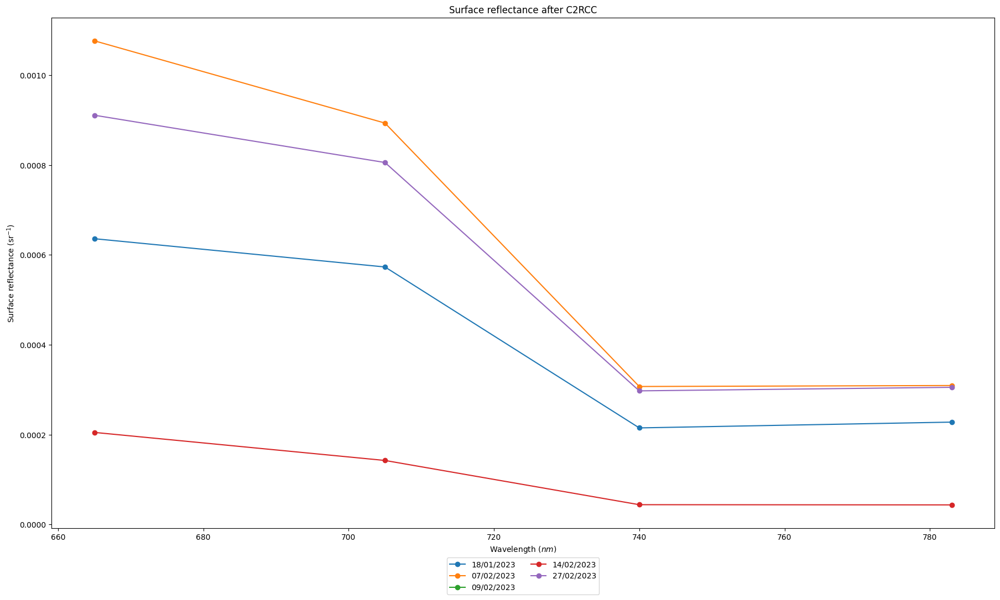

In [ ]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

arquivos_tif_dict = {date: arquivo_tif for date, arquivo_tif in arquivos_tif_dict.items() if date.year == 2023 and date.month in [1,2]}

# Configuring the single plot
fig, ax = plt.subplots(figsize=(22, 12))

# List of bands for Reflectance TOA
band_indices_new = { 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [ 665, 705, 740, 783]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars
        ax.errorbar(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

#### Explicações para a remoção das imagens:

25/05/2023 e 30/05/2023 tiverem efeitos que afetaram o sensor de captar corretamente os níveis de reflectância reais, sendo então excluidas da análise como outliers.

----- Obs: 22/10/2022 podemos ver que o lago ele está com grande presença de clorofila, que pode ser atestado no teste local, porém o sensor, como está mais na superfície, pega um valor subestimado.

As imagens do dia 07/02/2023, 03/04/2023, 08/04/2023 e 21/08/2023 devem ser excluidas devido ao ruído gerado pelo espalhamento.

As imagens no mês de fevereiro já sendo excluida a imagem 09/02/2023 pelos filtros do IdePix


In [ ]:
df_c2rcc

,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7,chlorophylle A
Date,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,1.657321,12.171855,3.456735,0.001123,0.000791,0.000925,0.000679,9.83
2022-10-22 10:50:09,11.492252,1.654627,9.328502,3.633259,12.450475,6.345382,8.282675,4.702090,13.470339,2.233648,10.078918,3.117704,0.001719,0.001363,0.001302,0.001128,4.67
2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,1.940370,9.352077,2.634387,0.000224,0.000153,0.000169,0.000126,4.13
2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,2.783343,11.104476,3.949646,0.000314,0.000203,0.000254,0.000184,11.13
2023-01-18 11:04:01,7.477668,1.399750,16.576378,5.128100,26.537342,6.926394,17.269571,3.624295,18.017925,2.283104,16.733086,3.850916,0.000534,0.000318,0.000474,0.000307,0.15
2023-02-07 11:02:21,16.193861,2.275436,12.733088,3.144849,21.000359,5.140545,13.782638,3.048241,15.777712,1.778634,13.265790,2.699080,0.001059,0.000639,0.000877,0.000560,0.79
2023-02-14 10:51:41,2.370013,0.320445,4.629401,1.181029,6.803401,4.246818,3.521503,2.907795,10.810039,0.996923,6.410118,1.250267,0.000148,0.000085,0.000094,0.000060,5.36
2023-02-27 11:00:11,11.119368,1.873018,16.276752,3.196611,26.359098,5.251359,16.807116,2.795807,17.675684,1.666802,16.252468,2.659519,0.000862,0.000557,0.000759,0.000513,7.82
2023-04-03 10:56:29,14.697074,1.949671,8.704678,3.146333,13.688530,6.596522,8.541276,4.513333,13.319324,2.039306,9.830250,2.810930,0.000671,0.000435,0.000499,0.000345,6.32


In [ ]:
# Define the dates to be removed
dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']


# Tranform the dates to datetime format
dates_to_remove = [pd.to_datetime(date) for date in dates_to_remove]

# Remove the specified days from the dataframe, independent of the time
df_c2rcc_filtered = df_c2rcc[~df_c2rcc.index.isin(dates_to_remove)]

# Create a new DataFrame to store the results
results_df_filtered = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl','Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1',
               'Empirical 2-bands - Equation 2', 'Empirical 3-bands - Equation 1',
               'Empirical 3-bands - Equation 3']:
    
    # Create the linear regression model
    model = LinearRegression()

    # Fit the model using the 'chlorophylle A' column as the independent variable and the current column as the dependent variable
    model.fit(df_c2rcc_filtered[['chlorophylle A']], df_c2rcc_filtered[column])

    # Predict the values using the model
    predicted_values = model.predict(df_c2rcc_filtered[['chlorophylle A']])

    # Calculate R-squared
    r2 = r2_score(df_c2rcc_filtered[column], predicted_values)

    # Calculate Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column])) * 100

    # Calculate Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(df_c2rcc_filtered[column], predicted_values))

    # Calculate Mean Relative Difference (MRD)
    mrd = np.mean((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column]) * 100

    # Append the results to the DataFrame
    results_df_filtered = pd.concat([results_df_filtered, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_filtered)


,Metric,R²,MAPD,RMSD,MRD
0,conc_chl,0.228721,571.717736,5.697138,-542.555299
1,Chlorophyll index 3-bands,0.220273,49.728485,3.332213,-26.148756
2,Empirical 2-bands - Equation 1,0.199683,58.621964,5.839324,-33.050607
3,Empirical 2-bands - Equation 2,0.223511,104.171849,4.089622,-74.669384
4,Empirical 3-bands - Equation 1,0.224034,13.913410,2.064665,-2.599928
5,Empirical 3-bands - Equation 3,0.213900,28.884193,2.801079,-10.290123


In [ ]:
df_c2rcc_filtered

,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7,chlorophylle A
Date,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,1.657321,12.171855,3.456735,0.001123,0.000791,0.000925,0.000679,9.83
2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,1.940370,9.352077,2.634387,0.000224,0.000153,0.000169,0.000126,4.13
2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,2.783343,11.104476,3.949646,0.000314,0.000203,0.000254,0.000184,11.13
2023-02-14 10:51:41,2.370013,0.320445,4.629401,1.181029,6.803401,4.246818,3.521503,2.907795,10.810039,0.996923,6.410118,1.250267,0.000148,0.000085,0.000094,0.000060,5.36
2023-02-27 11:00:11,11.119368,1.873018,16.276752,3.196611,26.359098,5.251359,16.807116,2.795807,17.675684,1.666802,16.252468,2.659519,0.000862,0.000557,0.000759,0.000513,7.82
2023-04-05 10:50:31,1.058552,0.141695,3.834559,0.643721,3.846885,1.444464,1.464515,1.068633,10.095224,0.393986,5.519803,0.486014,0.000122,0.000050,0.000070,0.000031,2.72
2023-05-03 10:56:19,2.716580,0.373806,4.840333,0.829959,5.311004,0.642236,2.801417,0.713207,10.691142,0.513575,6.257698,0.661365,0.000294,0.000139,0.000178,0.000087,8.38
2023-05-20 10:46:29,0.293951,0.065208,2.554587,0.464870,5.610142,1.106451,2.088366,0.484549,9.694802,0.136949,5.027952,0.167434,0.000267,0.000131,0.000156,0.000078,4.11
2023-05-28 10:56:21,9.378928,1.368726,7.932487,3.620760,12.732944,6.258388,7.786974,4.583531,12.877385,2.233876,9.237032,3.047184,0.000296,0.000154,0.000218,0.000130,8.09


### Read data from SNAP statistics and analyse the C2RCC adjusted

In [ ]:
results_initial = dataframes['results_1']


#Convert the 'time' column to datetime
results_initial['Date'] = pd.to_datetime(results_initial['Date'])

#Set the 'time' column as the index
results_initial.set_index('Date', inplace=True)

# Display the dataframe
results_initial

,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,windows3x3_empirical_2_bands_equation2_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,13.861522,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,3.693143,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,8.376152,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,17.750868,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,14.499175,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,6.850038,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,18.831007,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,13.775692,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000


In [ ]:
results_initial.columns

Index(['windows5x5_kd_z90max_mean', 'windows5x5_3_bands_model_chl_conc_mean',
       'windows5x5_empirical_2_bands_equation1_mean',
       'windows5x5_empirical_2_bands_equation2_mean',
       'windows5x5_empirical_3_bands_equation1_mean',
       'windows5x5_empirical_3_bands_equation3_mean',
       'windows5x5_conc_chl_mean', 'windows3x3_3_bands_model_chl_conc_mean',
       'windows3x3_empirical_2_bands_equation1_mean',
       'windows3x3_empirical_2_bands_equation2_mean',
       'windows3x3_empirical_3_bands_equation1_mean',
       'windows3x3_empirical_3_bands_equation3_mean',
       'windows3x3_conc_chl_mean', '3_bands_model_chl_conc',
       'empirical_2_bands_equation1', 'empirical_2_bands_equation2',
       'empirical_3_bands_equation1', 'empirical_3_bands_equation3',
       'conc_chl', 'Chl (C2RCC Adjusted All Pix)', 'Chla without Oz (C2RCC)',
       'Chl (C2X-COMPLEX-Nets All Pix)', 'Chl in loco REAL'],
      dtype='object')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = results_initial.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['Chl (C2RCC Adjusted All Pix)'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '', marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, marker='o', ls='', label='Chlorophylle A - C2RCC Adjusted')

    #ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

And the results of the statistics

In [ ]:
# Merge with in loco data
results_initial = pd.merge_asof(results_initial, df_loco, right_index = True, left_index = True,  direction='nearest')

In [ ]:
results_initial = results_initial.drop(pd.to_datetime('2022-11-04 11:01:29'))
results_initial = results_initial.drop(pd.to_datetime('2023-06-02 10:56:29'))
results_initial

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_initial = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['windows5x5_3_bands_model_chl_conc_mean',
       'windows5x5_empirical_2_bands_equation1_mean',
       'windows5x5_empirical_2_bands_equation2_mean',
       'windows5x5_empirical_3_bands_equation1_mean',
       'windows5x5_empirical_3_bands_equation3_mean',
       'windows5x5_conc_chl_mean', 'windows3x3_3_bands_model_chl_conc_mean',
       'windows3x3_empirical_2_bands_equation1_mean',
       'windows3x3_empirical_2_bands_equation2_mean',
       'windows3x3_empirical_3_bands_equation1_mean',
       'windows3x3_empirical_3_bands_equation3_mean',
       'windows3x3_conc_chl_mean', '3_bands_model_chl_conc',
       'empirical_2_bands_equation1', 'empirical_2_bands_equation2',
       'empirical_3_bands_equation1', 'empirical_3_bands_equation3',
       'conc_chl', 'Chl (C2RCC Adjusted All Pix)']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(results_initial[['chlorophylle A']], results_initial[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(results_initial[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(results_initial[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((results_initial[column] - predicted_values) / results_initial[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(results_initial[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((results_initial[column] - predicted_values) / results_initial[column]) * 100

    # Append the results to the DataFrame
    results_df_initial = pd.concat([results_df_initial, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_initial)

,Metric,R²,MAPD,RMSD,MRD
0,windows5x5_3_bands_model_chl_conc_mean,0.006807,65.571367,4.569175,-40.671603
1,windows5x5_empirical_2_bands_equation1_mean,0.006949,87.243799,7.985842,-58.900688
2,windows5x5_empirical_2_bands_equation2_mean,0.011280,184.919666,5.418393,-153.704561
3,windows5x5_empirical_3_bands_equation1_mean,0.008996,17.509842,2.732461,-4.285664
4,windows5x5_empirical_3_bands_equation3_mean,0.006578,38.205803,3.870962,-17.301035
5,windows5x5_conc_chl_mean,0.033148,747.982603,7.789042,-717.570160
6,windows3x3_3_bands_model_chl_conc_mean,0.005303,64.887569,4.552919,-39.459510
7,windows3x3_empirical_2_bands_equation1_mean,0.006652,99.336945,8.204180,-69.558397
8,windows3x3_empirical_2_bands_equation2_mean,0.010033,253.236588,5.539842,-220.485067
9,windows3x3_empirical_3_bands_equation1_mean,0.007553,17.945496,2.750475,-4.361262


Plot all windows 5x5 algoritms vs chl_inloco

### Bio-optical models plotted after C2RCC

In [ ]:
# Comparing to mean

import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    #daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [ ]:
# Comparing to mean

import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    # ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [ ]:
# Plot the graph
fig, ax = plt.subplots(figsize=(50, 20))

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    # Get the date and mean values of each band
    date = row['Date']
    band_values = row.drop('Date')
    
    # Plot the band values
    ax.plot(band_values.index, band_values.values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Band')
ax.set_ylabel('Mean Value')
ax.set_title('Mean Value of Each Band')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(df))

# Display the figure
plt.show()

In [ ]:
results_initial = dataframes['results_1']


#Convert the 'time' column to datetime
results_initial['Date'] = pd.to_datetime(results_initial['Date'])

#Set the 'time' column as the index
results_initial.set_index('Date', inplace=True)

# Display the dataframe
results_initial

,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,windows3x3_empirical_2_bands_equation2_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,13.861522,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,3.693143,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,8.376152,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,17.750868,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,14.499175,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,6.850038,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,18.831007,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,13.775692,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = consolitaded_df.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['average'].resample('D').mean().dropna()
    daily_mean12_unc = filtered_df7['sigma'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))


    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, yerr=daily_mean12_unc, marker='o', label='NDVIv')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

# Looking for the validation images

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates
import rasterio


In [2]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

In [ ]:
# Open the .tif image file
with rasterio.open('tif_files_final/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif') as dataset:
    # # Get the number of bands in the image
    # num_bands = dataset.count
    
    # # Iterate over each band
    # for band in range(1, num_bands + 1):
    #     # Read the band data
    #     band_data = dataset.read(band)
        
    #     # Get the band name
    #     band_name = band_labels[band - 1]
        
    #     # Plot the band data
    #     plt.imshow(band_data, cmap='gray')
    #     plt.title(f'Band {band}: {band_name}')
    #     plt.colorbar()
    #     plt.show()

    print(dataset.read(38).mean())
    

0.059054542


# Data processing

### Load and cleaning data

In [1]:
import pandas as pd

# Read the Excel file
excel_file = pd.ExcelFile('results_consolidate_for_pandas_validation.xlsx')

# Get the names of all tabs in the Excel file
sheet_names = excel_file.sheet_names

# Create an empty dictionary to store the dataframes
dataframes = {}

# Iterate over each tab
for sheet_name in sheet_names:
    # Read the tab as a dataframe
    df = excel_file.parse(sheet_name)
    
    # Store the dataframe in the dictionary
    dataframes[sheet_name] = df

# Access the dataframes by their tab names
for sheet_name, df in dataframes.items():
    print(f"Dataframe for tab '{sheet_name}':")
    print()


Dataframe for tab 'results_1':

Dataframe for tab 'results_validation':

Dataframe for tab 'data_loco_validation':

Dataframe for tab 'data_loco':

Dataframe for tab 'meteo':

Dataframe for tab 'vimeo_data_sensor':

Dataframe for tab 'laboratory_data':



Plotting the data for the time stamp analised

In [2]:

# Read the Excel file
df_loco = dataframes['data_loco_validation']

#Convert the 'time' column to datetime
df_loco['time'] = pd.to_datetime(df_loco['time'])

#Set the 'time' column as the index
df_loco.set_index('time', inplace=True)

# Read the Excel file
df_c2rcc = dataframes['results_validation']

#Convert the 'time' column to datetime
df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])

#Set the 'time' column as the index
df_c2rcc.set_index('Date', inplace=True)

In [23]:
df_c2rcc

,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma
Date,,,,,,
2023-10-07,10.364924,3.342311,13.159447,3.875402,10.3247,6.3304
2023-11-19,10.231260,3.785084,8.836949,4.869211,7.9150,5.4839
2023-12-06,0.225038,0.146777,0.208491,0.149733,0.2348,0.1915
2023-12-16,0.984444,0.892209,0.628259,0.760695,0.7228,0.9470
2024-01-05,7.446182,3.353092,5.843303,3.610125,5.0567,4.1353


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2023-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2024-01-10'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean2 = filtered_df2['conc_chl_mean_windows_3x3'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_5x5'].resample('D').mean()
    daily_mean4 = filtered_df2['conc_chl_mean'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean2_unc = filtered_df2['conc_chl_sigma_windows_3x3'].resample('D').mean()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_5x5'].resample('D').mean()
    daily_mean4_unc = filtered_df2['conc_chl_sigma'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, yerr=daily_mean1_unc, marker='o', label='Chlorophylle A - In Situ (Mean)')
    #ax1.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean2_unc, marker='o', label='Chlorophylle A - C2RCC (3x3)')
    #ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (5x5)')
    ax1.errorbar(daily_mean4.index, daily_mean4, yerr=daily_mean4_unc, marker='o', label='Chlorophylle A - C2RCC (All pixels)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2023-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2024-01-10 00:00:00'), description='End Date', step=1)

Output()

In [10]:
df_loco

,time,chlorophylle A
0,2023-10-04 00:16:19,41.46
1,2023-10-04 00:31:19,72.39
2,2023-10-04 00:46:19,45.35
3,2023-10-04 01:01:19,45.34
4,2023-10-04 01:16:19,34.19
...,...,...
8497,2024-01-05 22:46:28,0.14
8498,2024-01-05 23:01:28,0.48
8499,2024-01-05 23:16:28,0.62
8500,2024-01-05 23:31:28,0.09


In [27]:
# Set to 'time' be the index if it is not
if df_loco.index.name != 'time':
    # Convert colum time in datetime
    df_loco['time'] = pd.to_datetime(df_loco['time'])
    df_loco.set_index('time', inplace=True)
    
teste = df_loco['chlorophylle A'].resample('D').std()
upper_bound = df_loco['chlorophylle A'].resample('D').mean() + df_loco['chlorophylle A'].resample('D').std()
lower_bound = df_loco['chlorophylle A'].resample('D').mean() - df_loco['chlorophylle A'].resample('D').std()
display(max)
display(min)

# Merge for the df_loco the upper_bound and lower_bound for each row depending on the date



time
2023-10-04    41.900073
2023-10-05    24.849567
2023-10-06    22.741956
2023-10-07    19.289369
2023-10-08    20.613324
                ...    
2024-01-01     2.078658
2024-01-02     2.305065
2024-01-03     2.362608
2024-01-04     2.562595
2024-01-05     2.498061
Freq: D, Name: chlorophylle A, Length: 94, dtype: float64

time
2023-10-04    22.372400
2023-10-05    15.405017
2023-10-06    13.329502
2023-10-07    11.539381
2023-10-08    12.012092
                ...    
2024-01-01     1.098009
2024-01-02     1.605977
2024-01-03     1.550517
2024-01-04     1.313238
2024-01-05     0.806314
Freq: D, Name: chlorophylle A, Length: 94, dtype: float64

In [28]:
# Add for the df_loco the upper_bound and lower_bound for each row depending on the date
df_loco['upper_bound'] = upper_bound
df_loco['lower_bound'] = lower_bound

ValueError: Cannot set a DataFrame with multiple columns to the single column upper_bound

,chlorophylle A - Adjusted,conc_chl_mean
0,10.37,10.3247
1,6.13,7.9150
2,0.36,0.2348
3,0.36,0.7228
4,4.12,5.0567


Intercept: [0.46422034]
Coefficient: [[1.02778343]]
R2: 0.9683613189437288
RMSE: 0.7013829676772211


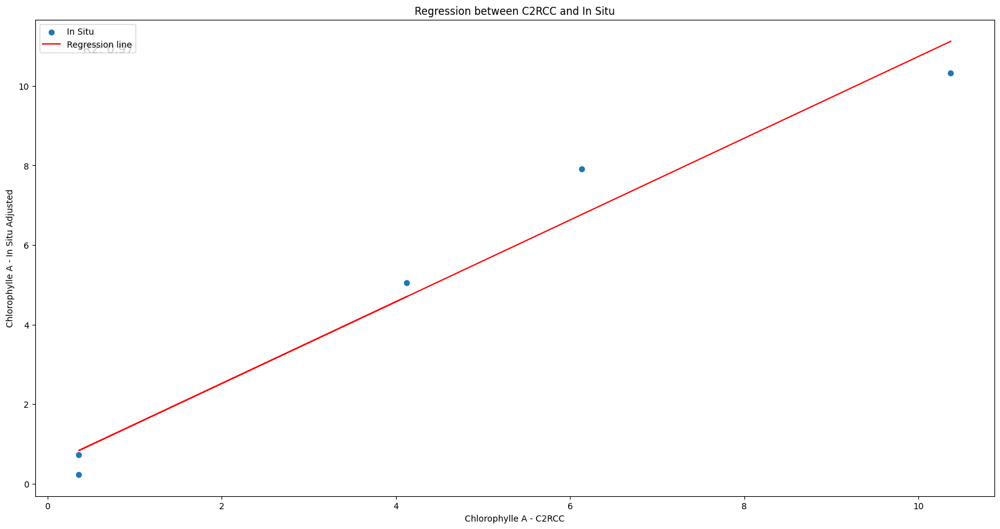

In [5]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Create a new column with the closest value of chlorophyllle A from in situ data

def encontrar_valor_proximo(x, df, janela_temporal=0.1):
    data_alvo = x['Date']
    valor_alvo = x['conc_chl_mean']

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        # Encontrar a linha com a menor diferença nos valores
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None

df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)

# display the columns chlorophyllle A and conc_chl
display(df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']])

# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['chlorophylle A - Adjusted']], df_c2rcc2[['conc_chl_mean']])
print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['chlorophylle A - Adjusted']], df_c2rcc2[['conc_chl_mean']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['conc_chl_mean']], model.predict(df_c2rcc2[['chlorophylle A - Adjusted']])) ** 0.5)

# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
ax.scatter(df_c2rcc2['chlorophylle A - Adjusted'], df_c2rcc2['conc_chl_mean'], label='In Situ')
ax.plot(df_c2rcc2['chlorophylle A - Adjusted'], model.predict(df_c2rcc2[['chlorophylle A - Adjusted']]), color='red', label='Regression line')

plt.xlabel('Chlorophylle A - C2RCC')
plt.ylabel('Chlorophylle A - In Situ Adjusted')
ax.text(0.05, 0.95, f'R2: {model.score(df_c2rcc2[["chlorophylle A - Adjusted"]], df_c2rcc2[["conc_chl_mean"]]):.2f}', transform=ax.transAxes, fontsize=14, verticalalignment='top')

plt.title('Regression between C2RCC and In Situ')
plt.legend()
plt.show()




In [6]:


# Merge the chrlorophylle A column from in situ data to c2rcc data
df_c2rcc = pd.merge_asof(df_c2rcc, df_loco[['time', 'chlorophylle A']], left_on='Date', right_on='time', direction='nearest')

# Merge the mean of the relative day chrlorophylle A column from in situ data to c2rcc data


df_c2rcc

,Date,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma,chlorophylle A - Adjusted,time,chlorophylle A
0,2023-10-07 10:48:29,10.364924,3.342311,13.159447,3.875402,10.3247,6.3304,10.37,2023-10-07 10:46:29,11.23
1,2023-11-19 11:02:00,10.231260,3.785084,8.836949,4.869211,7.9150,5.4839,6.13,2023-11-19 11:01:29,3.67
2,2023-12-06 10:53:00,0.225038,0.146777,0.208491,0.149733,0.2348,0.1915,0.36,2023-12-06 10:46:28,0.80
3,2023-12-16 10:53:49,0.984444,0.892209,0.628259,0.760695,0.7228,0.9470,0.36,2023-12-16 10:46:28,-0.12
4,2024-01-05 10:53:30,7.446182,3.353092,5.843303,3.610125,5.0567,4.1353,4.12,2024-01-05 10:46:28,0.85


In [30]:
# Set index to date for c2rcc
df_c2rcc.set_index('Date', inplace=True)

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2023-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2024-01-10'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df2['chlorophylle A - Adjusted'].resample('D').mean()
    daily_mean2 = filtered_df2['conc_chl_mean_windows_3x3'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_5x5'].resample('D').mean()
    daily_mean4 = filtered_df2['conc_chl_mean'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    #daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean2_unc = filtered_df2['conc_chl_sigma_windows_3x3'].resample('D').mean()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_5x5'].resample('D').mean()
    daily_mean4_unc = filtered_df2['conc_chl_sigma'].resample('D').mean()
    
    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Mean)')
    #ax1.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean2_unc, marker='o', label='Chlorophylle A - C2RCC (3x3)')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (5x5)')
    #ax1.errorbar(daily_mean4.index, daily_mean4, yerr=daily_mean4_unc, marker='o', label='Chlorophylle A - C2RCC (All pixels)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2023-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2024-01-10 00:00:00'), description='End Date', step=1)

Output()

Plotting the table for the statistics after adjusting

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_initial = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['windows5x5_3_bands_model_chl_conc_mean',
       'windows5x5_empirical_2_bands_equation1_mean',
       'windows5x5_empirical_2_bands_equation2_mean',
       'windows5x5_empirical_3_bands_equation1_mean',
       'windows5x5_empirical_3_bands_equation3_mean',
       'windows5x5_conc_chl_mean', 'windows3x3_3_bands_model_chl_conc_mean',
       'windows3x3_empirical_2_bands_equation1_mean',
       'windows3x3_empirical_2_bands_equation2_mean',
       'windows3x3_empirical_3_bands_equation1_mean',
       'windows3x3_empirical_3_bands_equation3_mean',
       'windows3x3_conc_chl_mean', '3_bands_model_chl_conc',
       'empirical_2_bands_equation1', 'empirical_2_bands_equation2',
       'empirical_3_bands_equation1', 'empirical_3_bands_equation3',
       'conc_chl', 'Chl (C2RCC Adjusted All Pix)']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(results_initial[['chlorophylle A']], results_initial[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(results_initial[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(results_initial[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((results_initial[column] - predicted_values) / results_initial[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(results_initial[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((results_initial[column] - predicted_values) / results_initial[column]) * 100

    # Append the results to the DataFrame
    results_df_initial = pd.concat([results_df_initial, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_initial)